# Train YoloV5 on the GTSRB Dataset
Here the idea would be to use Transferlearning with pretrained weights, but depending on the runtime it could also be interesting how yoloV5 performs with random initialized weights.

## Setup

In [1]:
!git clone https://github.com/AutonomeStudienarbeit/EvalFramework.git

Cloning into 'EvalFramework'...
remote: Enumerating objects: 288, done.
remote: Counting objects: 100% (227/227), done.
remote: Compressing objects: 100% (173/173), done.
remote: Total 288 (delta 75), reused 201 (delta 52), pack-reused 61
Receiving objects: 100% (288/288), 9.30 MiB | 19.21 MiB/s, done.
Resolving deltas: 100% (91/91), done.


In [2]:
!pip install -r ./EvalFramework/requirements.txt

     |████████████████████████████████| 880 kB 10.8 MB/s 
     |████████████████████████████████| 61 kB 6.4 MB/s 
     |████████████████████████████████| 11.2 MB 35.4 MB/s 
     |████████████████████████████████| 15.7 MB 14.0 MB/s 
     |████████████████████████████████| 60.3 MB 1.3 MB/s 
     |████████████████████████████████| 11.3 MB 33.1 MB/s 
     |████████████████████████████████| 3.1 MB 35.4 MB/s 
     |████████████████████████████████| 97 kB 6.5 MB/s 
     |████████████████████████████████| 503 kB 47.7 MB/s 
     |████████████████████████████████| 596 kB 44.9 MB/s 
     |████████████████████████████████| 62 kB 792 kB/s 
     |████████████████████████████████| 38.2 MB 1.4 MB/s 
     |████████████████████████████████| 138 kB 46.8 MB/s 
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.7
    Uninstalling pyparsing-3.0.7:
      Successfully uninstalled pyparsing-3.0.7
  Attempting uninstall: tomli
    Found existing installation: tomli 2.0.0
    Uninst

In [1]:
!pip install wandb

     |████████████████████████████████| 1.7 MB 5.2 MB/s 
     |████████████████████████████████| 180 kB 48.0 MB/s 
     |████████████████████████████████| 144 kB 39.4 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=7a76975315a47b7b97ff65e28c93e757b74e15a5a22904b0fbe93c867a7e8511
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built pathtools


In [2]:
!mv EvalFramework/* ./
!rm -rf EvalFramework/

In [3]:
# !rm -rf ~/.kaggle
!mkdir -p ~/.kaggle

In [4]:
!cp kaggle.json ~/.kaggle/

In [5]:
!ls -hal ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json

total 16K
drwxr-xr-x 2 root root 4.0K Feb 15 08:05 .
drwx------ 1 root root 4.0K Feb 15 08:04 ..
-rw-r--r-- 1 root root   65 Feb 15 08:05 kaggle.json


## Download and Prepare Dataset

In [ ]:
!rm -rf ./data/datasets/gtsrb
!rm -rf ./data/datasets/gtsrb.zip

In [6]:
from data.datasets import DatasetLoader

dataset_loader = DatasetLoader()
gtsrb_dataset = dataset_loader.load_dataset("GTSRB")



100%|██████████| 612M/612M [00:03<00:00, 199MB/s]


In [7]:
from data.models.yolov5 import YoloV5

yoloV5 = YoloV5()
yoloV5.prepare_dataset("gtsrb")

In [ ]:
import os
print(len(os.listdir("./data/datasets/gtsrb/Test/images")))
print(len(os.listdir("./data/datasets/gtsrb/Test/labels")))

12631
12630


In [8]:
!ls ./data/models/yolov5/yolov5-git/
!git clone https://github.com/AutonomeStudienarbeit/yolov5.git ./data/models/yolov5/yolov5-git/

Cloning into './data/models/yolov5/yolov5-git'...
remote: Enumerating objects: 10912, done.
remote: Total 10912 (delta 0), reused 0 (delta 0), pack-reused 10912
Receiving objects: 100% (10912/10912), 11.02 MiB | 21.87 MiB/s, done.
Resolving deltas: 100% (7538/7538), done.


## Train YoloV5 on GTSRB

There are several versions of various sizes available:
- YOLOv5n
- YOLOv5s
- YOLOv5m
- YOLOv5l
- YOLOV5x

More information can be found [here](https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data)


In [9]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir data/models/yolov5/yolov5-git/runs/train

<IPython.core.display.Javascript object>

In [11]:
!python ./data/models/yolov5/yolov5-git/train.py --img 250 --batch 200 --epochs 10 --data gtsrb.yaml --weights '' --cfg yolov5m.yaml

wandb: Currently logged in as: lkno0705 (use `wandb login --relogin` to force relogin)
train: weights=, cfg=yolov5m.yaml, data=gtsrb.yaml, hyp=data/models/yolov5/yolov5-git/data/hyps/hyp.scratch.yaml, epochs=10, batch_size=200, imgsz=250, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=data/models/yolov5/yolov5-git/runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/AutonomeStudienarbeit/yolov5 ✅
YOLOv5 🚀 v6.0-256-gff7e01d torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0

In [ ]:
!nvidia-smi

Thu Feb 10 15:25:06 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P0    59W / 149W |   1359MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!cat data/datasets/gtsrb/Train/labels/00013_00071_00017.txt

13 0.5102040816326531 0.5108695652173912 1.0 1.0

## Download Results

In [12]:
!zip -r ./runs.zip ./data/models/yolov5/yolov5-git/runs


  adding: data/models/yolov5/yolov5-git/runs/ (stored 0%)
  adding: data/models/yolov5/yolov5-git/runs/train/ (stored 0%)
  adding: data/models/yolov5/yolov5-git/runs/train/exp2/ (stored 0%)
  adding: data/models/yolov5/yolov5-git/runs/train/exp2/val_batch0_pred.jpg (deflated 19%)
  adding: data/models/yolov5/yolov5-git/runs/train/exp2/events.out.tfevents.1644912711.284eca7073a4.485.0 (deflated 18%)
  adding: data/models/yolov5/yolov5-git/runs/train/exp2/val_batch0_labels.jpg (deflated 21%)
  adding: data/models/yolov5/yolov5-git/runs/train/exp2/labels.jpg (deflated 42%)
  adding: data/models/yolov5/yolov5-git/runs/train/exp2/opt.yaml (deflated 52%)
  adding: data/models/yolov5/yolov5-git/runs/train/exp2/val_batch2_pred.jpg (deflated 19%)
  adding: data/models/yolov5/yolov5-git/runs/train/exp2/hyp.yaml (deflated 44%)
  adding: data/models/yolov5/yolov5-git/runs/train/exp2/F1_curve.png (deflated 8%)
  adding: data/models/yolov5/yolov5-git/runs/train/exp2/results.csv (deflated 80%)
  add

## Check how well the trained model generalizes on the gtsdb dataset
Both datasets have a similar task, however, the gtsdb dataset consists of images taken on the road, whereas the gtsrb is made of images from the traffic signs themselves.

In [ ]:
from data.datasets import DatasetLoader

dataset_loader = DatasetLoader()
gtsrb_dataset = dataset_loader.load_dataset("GTSDB")


100%|██████████| 1.61G/1.61G [00:38<00:00, 44.4MB/s]


In [ ]:
from data.models.yolov5 import YoloV5

yoloV5 = YoloV5()
yoloV5.prepare_dataset("gtsdb")

### Run a detection on gtsdb with gtsrb model
-> The Trained weights need to be put in the root directory of the project

In [ ]:
!python ./data/models/yolov5/yolov5-git/detect.py --weights best-e10-yolov5m.pt --source data/datasets/gtsdb/TrainIJCNN2013/images/00000.jpg

detect: weights=['best-e10-yolov5m.pt'], source=data/datasets/gtsdb/TrainIJCNN2013/images/00000.jpg, data=data/models/yolov5/yolov5-git/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=data/models/yolov5/yolov5-git/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-256-gff7e01d torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 290 layers, 21022656 parameters, 0 gradients
image 1/1 /content/data/datasets/gtsdb/TrainIJCNN2013/images/00000.jpg: 384x640 6 Vorfahrt gewährens, 1 Gefahrstelle, Done. (0.031s)
Speed: 0.5ms pre-process, 31.0ms inference, 15.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to data/models/yolov5/yolov5-git/runs/detect/exp2


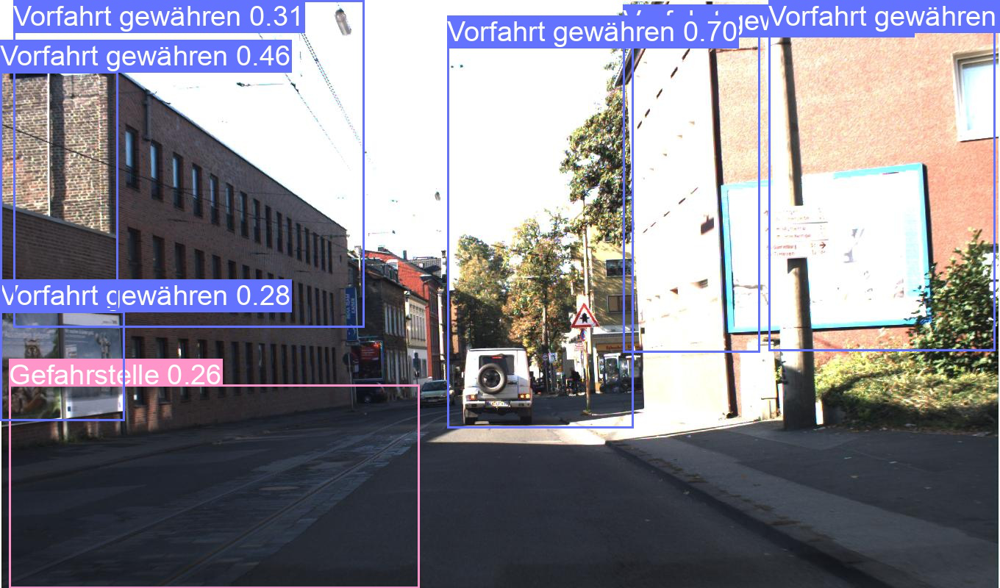

In [ ]:
display(Image.open("/content/data/models/yolov5/yolov5-git/runs/detect/exp2/00000.jpg"))

Das hat ja mal überhaupt nicht funktioniert lol -> Also um das Modell auf dem GTSDB anzuwenden müssen wir aufjedenfall nochmal das Modell nachtrainieren. Da kann man durchaus einen vergleich zwischen dem GTSDB model von Coco und dem Modell was auch die Daten zum GTSRB kennt machen.

In [ ]:
!python ./data/models/yolov5/yolov5-git/detect.py --weights yolov5m.pt --source data/datasets/gtsdb/TrainIJCNN2013/images/00000.jpg

detect: weights=['yolov5m.pt'], source=data/datasets/gtsdb/TrainIJCNN2013/images/00000.jpg, data=data/models/yolov5/yolov5-git/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=data/models/yolov5/yolov5-git/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-256-gff7e01d torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 290 layers, 21172173 parameters, 0 gradients
image 1/1 /content/data/datasets/gtsdb/TrainIJCNN2013/images/00000.jpg: 384x640 3 cars, 1 bus, 1 truck, 1 kite, Done. (0.031s)
Speed: 0.5ms pre-process, 31.1ms inference, 1.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to data/models/yolov5/yolov5-git/runs/detect/exp


Inference with Coco weigths:

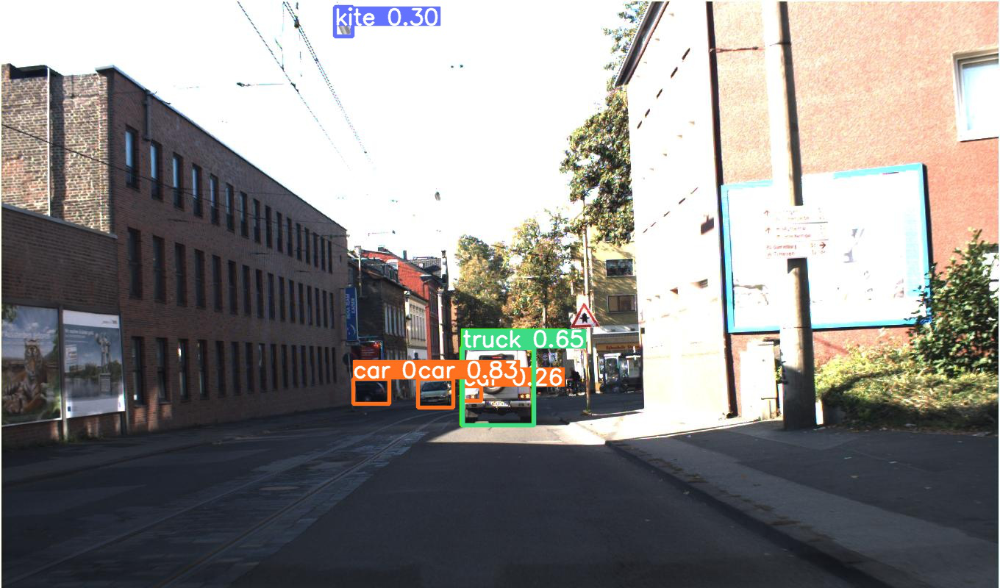

In [ ]:
display(Image.open("/content/data/models/yolov5/yolov5-git/runs/detect/exp/00000.jpg"))

## Train on GTSDB with GTSRB weights

-> Transfer learning

In [ ]:
!python ./data/models/yolov5/yolov5-git/train.py --img 1360 --batch 4 --epochs 20 --data gtsdb.yaml --weights best-e10-yolov5m.pt